# Merge S6 — Đánh giá model 8-class trên 3 held-out + surface metrics

Model cuối `Dataset020_KneeUnion` được đánh giá trên:
| Held-out | Class có GT | Domain |
|---|---|---|
| OAI-ZIB Ts (103) | bone + cartilage (1–5) | in-domain |
| iMorphics test (36) | cartilage + meniscus + patella (2,4,5,6,7,8) | same-domain |
| SKM-TEA (155) | cartilage + meniscus + patella | **cross-domain** |

Metrics per-class: **Dice, ASSD, HD95** (chỉ tính class có trong GT). Sụn so với baseline (fem 0.881 / med-tib 0.835 / lat-tib 0.855).


In [1]:
!pip install -q nnunetv2
!pip install -q git+https://github.com/google-deepmind/surface-distance.git


  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 291.1/291.1 kB 25.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.8/102.8 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.0/74.0 kB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 MB 63.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.9/28.9 MB 130.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.7/16.7 MB 206.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 181.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 227.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.4/96.4 kB 15.7 MB/s eta 

In [2]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


## 0) Config — CHỈNH trainer/checkpoint model cuối


In [3]:
import os
from pathlib import Path
os.environ["nnUNet_raw"]          = "/content/drive/MyDrive/nnUNet_raw"
os.environ["nnUNet_preprocessed"] = "/content/nnUNet_preprocessed"
os.environ["nnUNet_results"]      = "/content/drive/MyDrive/nnUNet_results"

RAW = Path("/content/drive/MyDrive/nnUNet_raw")
D1, D11, D12 = RAW/"Dataset001_KneeOA", RAW/"Dataset011_SKMTEA", RAW/"Dataset012_iMorphics"

# >>> model 8-class cuoi <<<
TR    = "nnUNetTrainer_250epochs"
PLANS = "nnUNetResEncUNetLPlans"
CHK   = "checkpoint_final.pth"     # dung "checkpoint_best.pth" neu dung o 200

TESTSETS = [
    {"key":"zib_ts",  "name":"OAI-ZIB Ts (in-domain)",     "img":D1/"imagesTs",  "lbl":D1/"labelsTs",  "classes":[1,2,3,4,5]},
    {"key":"imo_test","name":"iMorphics test (same-domain)","img":D12/"imagesTs", "lbl":D12/"labelsTs", "classes":[2,4,5,6,7,8]},
    {"key":"skmtea",  "name":"SKM-TEA (cross-domain)",      "img":D11/"imagesTr", "lbl":D11/"labelsTr", "classes":[2,4,5,6,7,8]},
]
for t in TESTSETS:
    n = len(list(Path(t["img"]).glob("*_0000.nii.gz"))) if Path(t["img"]).exists() else 0
    print(f"{t['name']:32s}: {n} ca | {t['img']}")

mp = Path(os.environ["nnUNet_results"])/"Dataset020_KneeUnion"/f"{TR}__{PLANS}__3d_fullres"/"fold_0"/CHK
print("\nmodel checkpoint:", "OK" if mp.exists() else "MISSING", mp)


OAI-ZIB Ts (in-domain)          : 103 ca | /content/drive/MyDrive/nnUNet_raw/Dataset001_KneeOA/imagesTs
iMorphics test (same-domain)    : 36 ca | /content/drive/MyDrive/nnUNet_raw/Dataset012_iMorphics/imagesTs
SKM-TEA (cross-domain)          : 155 ca | /content/drive/MyDrive/nnUNet_raw/Dataset011_SKMTEA/imagesTr

model checkpoint: OK /content/drive/MyDrive/nnUNet_results/Dataset020_KneeUnion/nnUNetTrainer_250epochs__nnUNetResEncUNetLPlans__3d_fullres/fold_0/checkpoint_final.pth


In [4]:
from pathlib import Path
d = Path("/content/drive/MyDrive/nnUNet_raw/Dataset011_SKMTEA/imagesTr")
files = sorted(p.name for p in d.iterdir() if p.is_file())
print("total:", len(files))
bad = [f for f in files if not f.endswith("_0000.nii.gz")]
print("KHONG khop _0000.nii.gz:", bad)
print("non-.nii.gz:", [f for f in files if not f.endswith(".nii.gz")])


total: 156
KHONG khop _0000.nii.gz: ['MTR_069_0000 (1).nii.gz']
non-.nii.gz: []


In [5]:
from pathlib import Path
d = Path("/content/drive/MyDrive/nnUNet_raw/Dataset011_SKMTEA/imagesTr")
(d/"MTR_069_0000 (1).nii.gz").unlink()
print("da xoa. Con lai:", len(list(d.glob("*_0000.nii.gz"))), "file")   # phai = 155


da xoa. Con lai: 155 file


In [7]:
dl = Path("/content/drive/MyDrive/nnUNet_raw/Dataset011_SKMTEA/labelsTr")
print("label la:", [p.name for p in dl.iterdir() if "(1)" in p.name or not p.name.endswith(".nii.gz")])


label la: []


## 1) Inference model cuối trên 3 held-out
(TTA bật mặc định cho eval chuẩn; ~1–1.5h tổng. Muốn nhanh thêm `--disable_tta`.)


In [6]:
for t in TESTSETS:
    out = f"/content/pred_{t['key']}"
    print("=== predict:", t["name"], "->", out)
    !nnUNetv2_predict -i {t['img']} -o {out} -d 20 -c 3d_fullres -p {PLANS} -tr {TR} -f 0 -chk {CHK}


=== predict: OAI-ZIB Ts (in-domain) -> /content/pred_zib_ts

#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

Traceback (most recent call last):
  File "/usr/local/bin/nnUNetv2_predict", line 8, in <module>
    sys.exit(predict_entry_point())
             ^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/nnunetv2/inference/predict_from_raw_data.py", line 1017, in predict_entry_point
    predictor.initialize_from_trained_model_folder(
  File "/usr/local/lib/python3.12/dist-packages/nnunetv2/inference/predict_from_raw_data.py", line 87, in initialize_from_trained_model_folder
    checkpoint = torch.load(join(model_trainin

In [11]:
# import nibabel as nib, numpy as np
# from pathlib import Path
# from tqdm.auto import tqdm

# D11 = Path("/content/drive/MyDrive/nnUNet_raw/Dataset011_SKMTEA")
# LOC = Path("/content/skmtea_ortho")
# (LOC/"imagesTr").mkdir(parents=True, exist_ok=True)
# (LOC/"labelsTr").mkdir(parents=True, exist_ok=True)

# def ortho(aff):
#     R=aff[:3,:3]; sp=np.sqrt((R**2).sum(0)); D=R/sp
#     U,_,Vt=np.linalg.svd(D); out=np.eye(4); out[:3,:3]=U@Vt*sp; out[:3,3]=aff[:3,3]; return out

# for ip in tqdm(sorted((D11/"imagesTr").glob("*_0000.nii.gz"))):
#     cid = ip.name.replace("_0000.nii.gz","")
#     im = nib.load(str(ip)); aff = ortho(im.affine)
#     nib.save(nib.Nifti1Image(np.asanyarray(im.dataobj), aff), str(LOC/"imagesTr"/ip.name))
#     lp = D11/"labelsTr"/f"{cid}.nii.gz"
#     if lp.exists():
#         lb = nib.load(str(lp))
#         nib.save(nib.Nifti1Image(np.asanyarray( lb.dataobj), aff), str(LOC/"labelsTr"/f"{cid}.nii.gz"))
# print("xong, ghi vao", LOC)


  0%|          | 0/155 [00:00<?, ?it/s]

EOFError: Compressed file ended before the end-of-stream marker was reached

In [12]:
import nibabel as nib, numpy as np
from pathlib import Path
from tqdm.auto import tqdm

D11 = Path("/content/drive/MyDrive/nnUNet_raw/Dataset011_SKMTEA")
LOC = Path("/content/skmtea_ortho")
(LOC/"imagesTr").mkdir(parents=True, exist_ok=True); (LOC/"labelsTr").mkdir(parents=True, exist_ok=True)

def ortho(aff):
    R=aff[:3,:3]; sp=np.sqrt((R**2).sum(0)); D=R/sp
    U,_,Vt=np.linalg.svd(D); out=np.eye(4); out[:3,:3]=U@Vt*sp; out[:3,3]=aff[:3,3]; return out

ok, bad = [], []
for ip in tqdm(sorted((D11/"imagesTr").glob("*_0000.nii.gz"))):
    cid = ip.name.replace("_0000.nii.gz","")
    out_img = LOC/"imagesTr"/ip.name
    if out_img.exists():                       # da lam roi -> bo qua (resume)
        ok.append(cid); continue
    try:
        im = nib.load(str(ip)); arr = np.asanyarray(im.dataobj); aff = ortho(im.affine)
        lb = nib.load(str(D11/"labelsTr"/f"{cid}.nii.gz")); larr = np.asanyarray(lb.dataobj)
        nib.save(nib.Nifti1Image(arr, aff), str(out_img))
        nib.save(nib.Nifti1Image(larr, aff), str(LOC/"labelsTr"/f"{cid}.nii.gz"))
        ok.append(cid)
    except Exception as e:
        bad.append(cid); print("HONG:", cid, "->", type(e).__name__)
print(f"\nOK={len(ok)} | HONG={len(bad)}: {bad}")


  0%|          | 0/155 [00:00<?, ?it/s]

HONG: MTR_236 -> error

OK=154 | HONG=1: ['MTR_236']


MTR_182 | img (512, 512, 160) | lab (512, 512, 160) | labels [0, 2, 4, 5, 6, 7, 8]


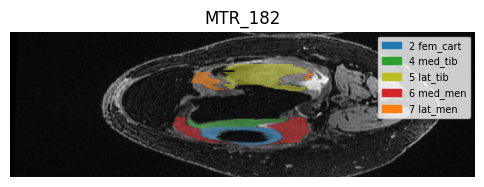

MTR_163 | img (512, 512, 160) | lab (512, 512, 160) | labels [0, 2, 4, 5, 6, 7, 8]


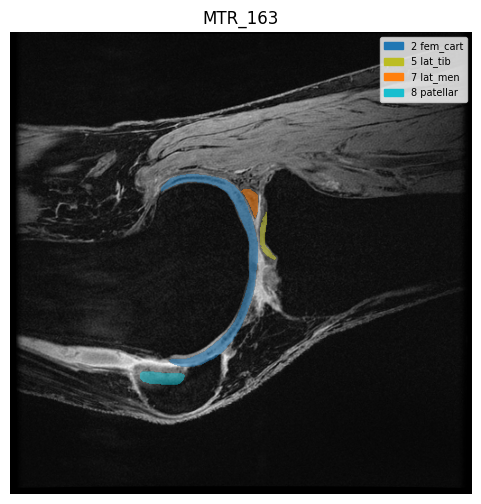

In [13]:
import numpy as np, nibabel as nib, matplotlib.pyplot as plt, matplotlib.colors as mcolors, random
from matplotlib.patches import Patch
from pathlib import Path

D11 = Path("/content/drive/MyDrive/nnUNet_raw/Dataset011_SKMTEA")
NM  = {2:"fem_cart",4:"med_tib",5:"lat_tib",6:"med_men",7:"lat_men",8:"patellar"}
COL = {2:"#1f77b4",4:"#2ca02c",5:"#bcbd22",6:"#d62728",7:"#ff7f0e",8:"#17becf"}

def best_slice(lab):
    best=(-1,0,0)
    for ax in range(3):
        c=(lab>0).sum(axis=tuple(i for i in range(3) if i!=ax))
        if c.max()>best[0]: best=(c.max(),ax,int(c.argmax()))
    return best[1],best[2]

for cid in random.sample([p.name.replace(".nii.gz","") for p in (D11/"labelsTr").glob("*.nii.gz")], 2):
    img = np.asanyarray(nib.load(str(D11/"imagesTr"/f"{cid}_0000.nii.gz")).dataobj).astype(float)
    lab = np.asanyarray(nib.load(str(D11/"labelsTr"/f"{cid}.nii.gz")).dataobj).astype(int)
    print(cid, "| img", img.shape, "| lab", lab.shape, "| labels", np.unique(lab).tolist())
    ax,z = best_slice(lab)
    ims = np.take(img,z,axis=ax); lbs = np.take(lab,z,axis=ax)
    ims = (ims-ims.min())/(np.ptp(ims)+1e-6); pres=[int(l) for l in np.unique(lbs) if l]
    plt.figure(figsize=(6,6)); plt.imshow(ims.T,cmap="gray",origin="lower")
    rgba=np.zeros(lbs.shape+(4,))
    for l in pres:
        m=lbs==l
        if m.any(): rgba[m,:3]=mcolors.to_rgb(COL[l]); rgba[m,3]=0.55
    plt.imshow(np.transpose(rgba,(1,0,2)),origin="lower")
    plt.legend(handles=[Patch(color=COL[l],label=f"{l} {NM[l]}") for l in pres],
               loc="upper right",fontsize=7); plt.title(cid); plt.axis("off"); plt.show()


In [17]:
import nibabel as nib, numpy as np
from pathlib import Path
from tqdm.auto import tqdm

SRC = Path("/content/drive/MyDrive/nnUNet_raw/Dataset011_SKMTEA")
LOC = Path("/content/skmtea_clean")
(LOC/"imagesTr").mkdir(parents=True, exist_ok=True); (LOC/"labelsTr").mkdir(parents=True, exist_ok=True)

def ortho(aff):
    R=aff[:3,:3]; sp=np.sqrt((R**2).sum(0)); D=R/sp
    U,_,Vt=np.linalg.svd(D); out=np.eye(4); out[:3,:3]=U@Vt*sp; out[:3,3]=aff[:3,3]; return out

ok, bad = [], []
for ip in tqdm(sorted((SRC/"imagesTr").glob("*_0000.nii.gz"))):
    cid = ip.name.replace("_0000.nii.gz","")
    oi, ol = LOC/"imagesTr"/ip.name, LOC/"labelsTr"/f"{cid}.nii.gz"
    if oi.exists() and ol.exists(): ok.append(cid); continue          # resume
    try:
        im = nib.load(str(ip)); a = np.nan_to_num(np.asanyarray(im.dataobj).astype(np.float32))  # dep NaN/Inf
        lb = nib.load(str(SRC/"labelsTr"/f"{cid}.nii.gz")); la = np.asanyarray(lb.dataobj).astype(np.uint8)
        aff = ortho(im.affine)
        nib.save(nib.Nifti1Image(a, aff), str(oi))
        nib.save(nib.Nifti1Image(la, aff), str(ol))
        ok.append(cid)
    except Exception as e:
        bad.append(cid); print("BO QUA (hong):", cid, type(e).__name__)
print(f"OK={len(ok)} | BO QUA={len(bad)}: {bad}")


  0%|          | 0/155 [00:00<?, ?it/s]

BO QUA (hong): MTR_236 error
OK=154 | BO QUA=1: ['MTR_236']


In [18]:
import SimpleITK as sitk, numpy as np
from pathlib import Path
LOC = Path("/content/skmtea_clean")
good, bad = [], []
for ip in sorted((LOC/"imagesTr").glob("*_0000.nii.gz")):
    cid = ip.name.replace("_0000.nii.gz","")
    try:
        a = sitk.GetArrayFromImage(sitk.ReadImage(str(ip)))   # dung reader nhu nnUNet
        assert np.isfinite(a).all()                            # khong NaN/Inf
        good.append(cid)
    except Exception as e:
        bad.append(cid)
        ip.unlink(missing_ok=True)                             # loai khoi folder predict
        (LOC/"labelsTr"/f"{cid}.nii.gz").unlink(missing_ok=True)
        print("LOAI:", cid, type(e).__name__)
print(f"\ngood={len(good)} | loai={len(bad)}: {bad}")



good=154 | loai=0: []


In [19]:
!nnUNetv2_predict -i /content/skmtea_clean/imagesTr -o /content/pred_skmtea -d 20 -c 3d_fullres -p nnUNetResEncUNetLPlans -tr nnUNetTrainer_250epochs -f 0 -chk checkpoint_final.pth -npp 1 -nps 1



#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 154 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 154 cases that I would like to predict

Predicting MTR_001:
perform_everything_on_device: True
100% 24/24 [00:20<00:00,  1.15it/s]
sending off prediction to background worker for resampling and export
done with MTR_001

Predicting MTR_005:
perform_everything_on_device: True
100% 24/24 [00:12<00:00,  1.87it/s]
sending off prediction to background worker for resampling and export
done with MTR_005

Predicting MTR_006:
perform_everything_on_device: True
100% 24/24 [00:12<

In [30]:
!nnUNetv2_predict -i /content/drive/MyDrive/nnUNet_raw/Dataset001_KneeOA/imagesTs -o /content/pred_zib_ts -d 20 -c 3d_fullres -p nnUNetResEncUNetLPlans -tr nnUNetTrainer_250epochs -f 0 -chk checkpoint_final.pth
!nnUNetv2_predict -i /content/drive/MyDrive/nnUNet_raw/Dataset012_iMorphics/imagesTs -o /content/pred_imo_test -d 20 -c 3d_fullres -p nnUNetResEncUNetLPlans -tr nnUNetTrainer_250epochs -f 0 -chk checkpoint_final.pth



#######################################################################
Please cite the following paper when using nnU-Net:
Isensee, F., Jaeger, P. F., Kohl, S. A., Petersen, J., & Maier-Hein, K. H. (2021). nnU-Net: a self-configuring method for deep learning-based biomedical image segmentation. Nature methods, 18(2), 203-211.
#######################################################################

There are 103 cases in the source folder
I am process 0 out of 1 (max process ID is 0, we start counting with 0!)
There are 103 cases that I would like to predict

Predicting oaizib_405:
perform_everything_on_device: True
100% 8/8 [00:12<00:00,  1.54s/it]
sending off prediction to background worker for resampling and export
done with oaizib_405

Predicting oaizib_406:
perform_everything_on_device: True
100% 8/8 [00:04<00:00,  1.89it/s]
sending off prediction to background worker for resampling and export
done with oaizib_406

Predicting oaizib_407:
perform_everything_on_device: True
100% 8/

In [31]:
import shutil
for k in ["zib_ts","imo_test","skmtea"]:
    shutil.copytree(f"/content/pred_{k}", f"/content/drive/MyDrive/preds/pred_{k}", dirs_exist_ok=True)


## 2) Tính Dice + ASSD + HD95 per-class


In [21]:
!pip install --force-reinstall -q numpy

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.5.1 which is incompatible.


In [23]:
from pathlib import Path
from collections import defaultdict
from tqdm.auto import tqdm
import numpy as np

for t in TESTSETS:
    if t["key"]=="skmtea": t["lbl"]=Path("/content/skmtea_clean/labelsTr")

t = next(x for x in TESTSETS if x["key"]=="skmtea")
acc = defaultdict(lambda: {"dice":[], "assd":[], "hd95":[]})
outp = Path("/content/pred_skmtea")
for c in tqdm(sorted(x.name.replace(".nii.gz","") for x in Path(t["lbl"]).glob("*.nii.gz"))):
    pr = outp/f"{c}.nii.gz"
    if not pr.exists(): continue
    try:
        for cls,(d,a,h) in eval_case(Path(t["lbl"])/f"{c}.nii.gz", pr, t["classes"]).items():
            acc[cls]["dice"].append(d)
            if not np.isnan(a): acc[cls]["assd"].append(a); acc[cls]["hd95"].append(h)
    except Exception as e:
        print("skip", c, type(e).__name__)
results["skmtea"] = acc
print("SKM-TEA done")


  0%|          | 0/154 [00:00<?, ?it/s]

SKM-TEA done


In [32]:
import os
for k in ["zib_ts","imo_test","skmtea"]:
    p=f"/content/pred_{k}"; print(k, ":", len(os.listdir(p)) if os.path.exists(p) else "MISSING")
print("skmtea_clean labels:", os.path.exists("/content/skmtea_clean/labelsTr"))


zib_ts : 106
imo_test : 39
skmtea : 157
skmtea_clean labels: True


In [35]:
import SimpleITK as sitk, numpy as np
from pathlib import Path
from collections import defaultdict
from tqdm.auto import tqdm

for t in TESTSETS:
    if t["key"]=="skmtea": t["lbl"]=Path("/content/skmtea_clean/labelsTr")

def surf(gi,pi):
    gdm=sitk.Abs(sitk.SignedMaurerDistanceMap(gi,squaredDistance=False,useImageSpacing=True))
    pdm=sitk.Abs(sitk.SignedMaurerDistanceMap(pi,squaredDistance=False,useImageSpacing=True))
    gs=sitk.GetArrayViewFromImage(sitk.LabelContour(gi)).astype(bool)
    ps=sitk.GetArrayViewFromImage(sitk.LabelContour(pi)).astype(bool)
    d1=sitk.GetArrayViewFromImage(gdm)[ps]; d2=sitk.GetArrayViewFromImage(pdm)[gs]
    if len(d1)==0 or len(d2)==0: return np.nan,np.nan
    a=np.concatenate([d1,d2]); return float(a.mean()), float(np.percentile(a,95))

def eval_case(gp,pp,classes):
    g=sitk.ReadImage(str(gp)); p=sitk.ReadImage(str(pp))
    ga=sitk.GetArrayFromImage(g).astype(np.int16); pa=sitk.GetArrayFromImage(p).astype(np.int16)
    o={}
    for c in classes:
        gm,pm=ga==c,pa==c
        if gm.sum()==0: continue
        dice=2*(gm&pm).sum()/(gm.sum()+pm.sum()+1e-8)
        if pm.sum()==0: o[c]=(dice,np.nan,np.nan); continue
        gi=sitk.GetImageFromArray(gm.astype(np.uint8)); gi.CopyInformation(g)
        pi=sitk.GetImageFromArray(pm.astype(np.uint8)); pi.CopyInformation(p)
        a,h=surf(gi,pi); o[c]=(dice,a,h)
    return o

results={}
for t in TESTSETS:
    outp=Path(f"/content/pred_{t['key']}")
    acc=defaultdict(lambda:{"dice":[],"assd":[],"hd95":[]}); got=0
    cases=sorted(x.name.replace(".nii.gz","") for x in Path(t["lbl"]).glob("*.nii.gz"))
    for c in tqdm(cases, desc=t["key"]):
        pr=outp/f"{c}.nii.gz"
        if not pr.exists(): continue
        try:
            for cls,(d,a,h) in eval_case(Path(t["lbl"])/f"{c}.nii.gz", pr, t["classes"]).items():
                acc[cls]["dice"].append(d)
                if not np.isnan(a): acc[cls]["assd"].append(a); acc[cls]["hd95"].append(h)
            got+=1
        except Exception as e:
            print("skip",c,type(e).__name__)
    results[t["key"]]=acc
    print(f"{t['name']}: {got}/{len(cases)} ca")


zib_ts:   0%|          | 0/103 [00:00<?, ?it/s]

OAI-ZIB Ts (in-domain): 103/103 ca


imo_test:   0%|          | 0/36 [00:00<?, ?it/s]

iMorphics test (same-domain): 36/36 ca


skmtea:   0%|          | 0/154 [00:00<?, ?it/s]

SKM-TEA (cross-domain): 154/154 ca


## 3) Bảng kết quả


In [36]:
NM={1:"femoral_bone",2:"femoral_cart",3:"tibial_bone",4:"med_tib_cart",5:"lat_tib_cart",6:"med_meniscus",7:"lat_meniscus",8:"patellar_cart"}
BASE={2:0.881,4:0.835,5:0.855}
for t in TESTSETS:
    acc=results.get(t["key"])
    if not acc: print(f"\n[{t['name']}] chua co"); continue
    print("\n"+"="*70+f"\n{t['name']}\n"+"="*70)
    print(f"{'class':18s} {'Dice':>7} {'ASSD':>7} {'HD95':>7} {'vs base':>8} {'n':>4}")
    for c in t["classes"]:
        if c not in acc or not acc[c]["dice"]: continue
        d=np.mean(acc[c]["dice"]); a=np.mean(acc[c]["assd"]) if acc[c]["assd"] else np.nan
        h=np.mean(acc[c]["hd95"]) if acc[c]["hd95"] else np.nan
        dl=f"{d-BASE[c]:+.3f}" if c in BASE else "-"
        print(f"{NM[c]:18s} {d:7.3f} {a:7.2f} {h:7.2f} {dl:>8} {len(acc[c]['dice']):4d}")



OAI-ZIB Ts (in-domain)
class                 Dice    ASSD    HD95  vs base    n
femoral_bone         0.986    0.25    0.78        -  103
femoral_cart         0.891    0.21    0.77   +0.010  103
tibial_bone          0.987    0.17    0.70        -  103
med_tib_cart         0.852    0.27    0.87   +0.017  103
lat_tib_cart         0.868    0.27    0.94   +0.013  103

iMorphics test (same-domain)
class                 Dice    ASSD    HD95  vs base    n
femoral_cart         0.868    0.24    0.86   -0.013   36
med_tib_cart         0.851    0.31    1.02   +0.016   36
lat_tib_cart         0.902    0.25    0.81   +0.047   36
med_meniscus         0.859    0.76    3.04        -   36
lat_meniscus         0.900    0.26    0.94        -   36
patellar_cart        0.859    0.49    1.57        -   36

SKM-TEA (cross-domain)
class                 Dice    ASSD    HD95  vs base    n
femoral_cart         0.405     nan     nan   -0.476  154
med_tib_cart         0.035     nan     nan   -0.800  154
lat_tib_ca

iMorphics 9003406_V00_L labels: [0, 2, 4, 5, 6, 7, 8]
SKM-TEA MTR_001 labels: [0, 2, 4, 5, 6, 7, 8]


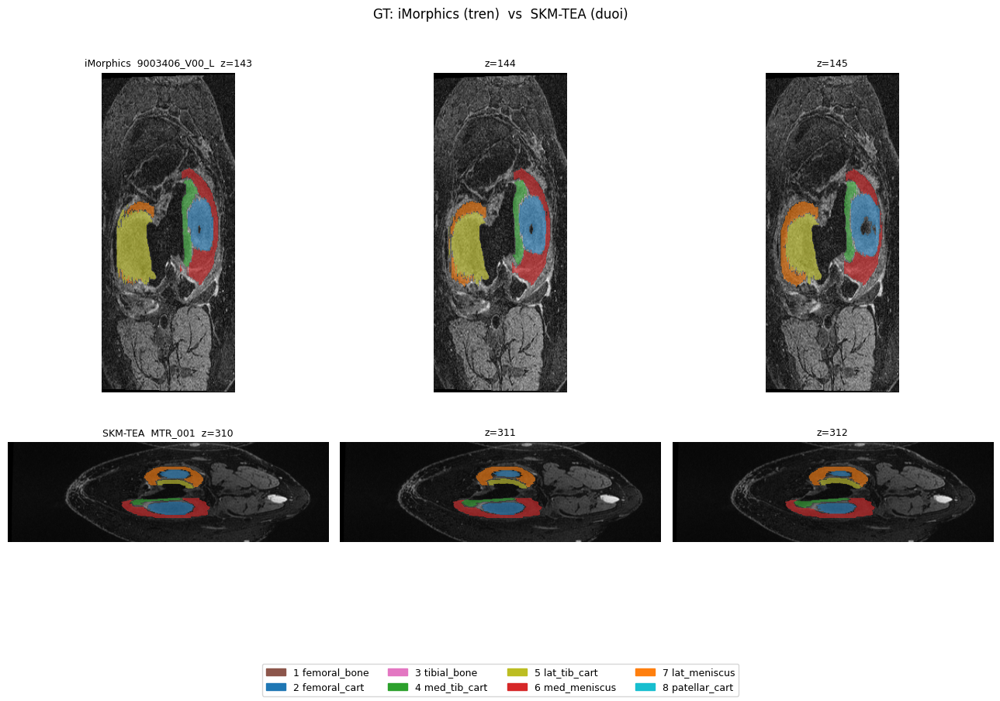

HTML:/content/drive/MyDrive/gt_imorph_vs_skmtea.html


In [37]:
import numpy as np, nibabel as nib, base64
import matplotlib.pyplot as plt, matplotlib.colors as mcolors
from matplotlib.patches import Patch
from pathlib import Path

NM={1:"femoral_bone",2:"femoral_cart",3:"tibial_bone",4:"med_tib_cart",5:"lat_tib_cart",6:"med_meniscus",7:"lat_meniscus",8:"patellar_cart"}
COL={1:"#8c564b",2:"#1f77b4",3:"#e377c2",4:"#2ca02c",5:"#bcbd22",6:"#d62728",7:"#ff7f0e",8:"#17becf"}
SETS={
 "iMorphics":("/content/drive/MyDrive/nnUNet_raw/Dataset012_iMorphics/imagesTs",
              "/content/drive/MyDrive/nnUNet_raw/Dataset012_iMorphics/labelsTs"),
 "SKM-TEA":  ("/content/skmtea_clean/imagesTr","/content/skmtea_clean/labelsTr"),
}
def over(a_,im2,lb2):
    a_.imshow(im2.T,cmap="gray",origin="lower")
    rgba=np.zeros(lb2.shape+(4,))
    for l in range(1,9):
        m=lb2==l
        if m.any(): rgba[m,:3]=mcolors.to_rgb(COL[l]); rgba[m,3]=0.6
    a_.imshow(np.transpose(rgba,(1,0,2)),origin="lower"); a_.axis("off")
def best(lb,n=3):
    ax=int(np.argmax([(lb>0).sum(axis=tuple(j for j in range(3) if j!=a)).max() for a in range(3)]))
    cnt=(lb>0).sum(axis=tuple(j for j in range(3) if j!=ax))
    return ax, sorted(int(z) for z in np.argsort(cnt)[::-1][:n])

fig,axes=plt.subplots(2,3,figsize=(13,9))
for r,(name,(imgd,lbld)) in enumerate(SETS.items()):
    IMG,LBL=Path(imgd),Path(lbld)
    cases=sorted(p.name.replace(".nii.gz","") for p in LBL.glob("*.nii.gz"))
    CASE=max(cases,key=lambda c:len(np.unique(np.asanyarray(nib.load(str(LBL/f"{c}.nii.gz")).dataobj))))
    img=np.asanyarray(nib.load(str(IMG/f"{CASE}_0000.nii.gz")).dataobj).astype(float)
    lb =np.asanyarray(nib.load(str(LBL/f"{CASE}.nii.gz")).dataobj).astype(int)
    imn=(img-img.min())/(np.ptp(img)+1e-6); ax,zs=best(lb,3)
    for c,z in enumerate(zs):
        over(axes[r,c],np.take(imn,z,ax),np.take(lb,z,ax))
        axes[r,c].set_title((f"{name}  {CASE}  " if c==0 else "")+f"z={z}",fontsize=9)
    print(name, CASE, "labels:", np.unique(lb).tolist())
fig.legend(handles=[Patch(color=COL[l],label=f"{l} {NM[l]}") for l in range(1,9)],
           loc="lower center",ncol=4,fontsize=9)
fig.suptitle("GT: iMorphics (tren)  vs  SKM-TEA (duoi)",y=0.99)
plt.tight_layout(rect=[0,0.05,1,0.97])
fig.savefig("/content/gt_cmp.png",dpi=110,bbox_inches="tight"); plt.show()
b64=base64.b64encode(open("/content/gt_cmp.png","rb").read()).decode()
open("/content/drive/MyDrive/gt_imorph_vs_skmtea.html","w").write(
 f"<html><body style='background:#111;color:#eee;text-align:center'><h3>GT: iMorphics vs SKM-TEA</h3><img style='max-width:100%' src='data:image/png;base64,{b64}'></body></html>")
print("HTML:/content/drive/MyDrive/gt_imorph_vs_skmtea.html")


In [38]:
import numpy as np, nibabel as nib
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from skimage import measure
from pathlib import Path

NM ={1:"femoral_bone",2:"femoral_cart",3:"tibial_bone",4:"med_tib_cart",
     5:"lat_tib_cart",6:"med_meniscus",7:"lat_meniscus",8:"patellar_cart"}
COL={1:"#8c564b",2:"#1f77b4",3:"#e377c2",4:"#2ca02c",5:"#bcbd22",6:"#d62728",7:"#ff7f0e",8:"#17becf"}

def add_meshes(fig, vol, scene, ds=2, show_leg=True):
    v = np.asarray(vol)[::ds, ::ds, ::ds]
    for lab, col in COL.items():
        m = (v == lab)
        if m.sum() < 10:
            continue
        verts, faces, _, _ = measure.marching_cubes(m.astype(float), level=0.5)
        x, y, z = verts.T; i, j, k = faces.T
        fig.add_trace(go.Mesh3d(x=x, y=y, z=z, i=i, j=j, k=k, color=col, opacity=1.0,
                                name=NM[lab], legendgroup=NM[lab], showlegend=show_leg,
                                scene=scene), row=1, col=(1 if scene=="scene" else 2))

def gt_vs_pred_3d(case, img_lbl_dir, pred_key, title, out_html, ds=2):
    GT   = Path(img_lbl_dir)/f"{case}.nii.gz"
    PRED = Path(f"/content/pred_{pred_key}")/f"{case}.nii.gz"
    gt = np.asarray(nib.load(str(GT)).dataobj)
    pd = np.asarray(nib.load(str(PRED)).dataobj)
    print(title, case, "| GT", np.unique(gt).tolist(), "| PRED", np.unique(pd).tolist())
    fig = make_subplots(rows=1, cols=2, specs=[[{"type":"mesh3d"},{"type":"mesh3d"}]],
                        subplot_titles=[f"GT — {case}", f"PRED — {case}"], horizontal_spacing=0.02)
    add_meshes(fig, gt, "scene",  ds, show_leg=True)   # trai = GT (co legend)
    add_meshes(fig, pd, "scene2", ds, show_leg=False)  # phai = Pred
    cam = dict(scene_aspectmode="data", scene2_aspectmode="data")
    fig.update_layout(title=title, **cam, height=700, legend=dict(orientation="h", y=-0.05))
    fig.write_html(out_html)
    print("saved:", out_html); fig.show()

# ==== chon 1 ca iMorph + 1 ca SKM-TEA (co du 8 class thi de nhin) ====
D12 = "/content/drive/MyDrive/nnUNet_raw/Dataset012_iMorphics/labelsTs"
gt_vs_pred_3d(sorted(p.name[:-7] for p in Path(D12).glob("*.nii.gz"))[0],
              D12, "imo_test", "iMorphics (same-domain)  GT vs Pred",
              "/content/drive/MyDrive/mesh3d_imorph.html", ds=2)

SKM = "/content/skmtea_clean/labelsTr"
gt_vs_pred_3d(sorted(p.name[:-7] for p in Path(SKM).glob("*.nii.gz"))[0],
              SKM, "skmtea", "SKM-TEA (cross-domain)  GT vs Pred",
              "/content/drive/MyDrive/mesh3d_skmtea.html", ds=2)


iMorphics (same-domain)  GT vs Pred 9003406_V00_L | GT [0, 2, 4, 5, 6, 7, 8] | PRED [0, 1, 2, 3, 4, 5, 6, 7, 8]
saved: /content/drive/MyDrive/mesh3d_imorph.html


SKM-TEA (cross-domain)  GT vs Pred MTR_001 | GT [0, 2, 4, 5, 6, 7, 8] | PRED [0, 1, 2, 3, 4, 8]
saved: /content/drive/MyDrive/mesh3d_skmtea.html


## Kết luận (đọc sau khi có bảng)
- **Sụn (2,4,5)** trên ZIB Ts / iMorph test: so cột `vs base` — kỳ vọng dương (ResEnc + iMorphics data).
- **Meniscus (6,7)** thật: xem iMorph test (same-domain) vs SKM-TEA (cross-domain). Chênh lệch lớn = domain shift → cân nhắc harmonize / thêm SKM-TEA vào train sau.
- **ASSD/HD95**: nhỏ = biên sụn khớp tốt (quan trọng lâm sàng hơn Dice cho sụn mỏng).
- Muốn mạnh hơn: train thêm fold 1–4 (ensemble) hoặc ResEnc-XL / 500–1000 epoch.
